# Import necessary libraries

In [1]:
from torch.nn import Linear 
from torch_geometric.nn import GCNConv
from torch.nn import Module
import torch
import torch.nn.functional as F
import numpy as np
import pandas as pd
import networkx as nx
from torch_geometric.utils import from_networkx
from torch_geometric.utils  import to_networkx
from torch_geometric.transforms import RandomLinkSplit

import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.pyplot import Circle
from matplotlib.animation import FuncAnimation
import random

from itertools import chain

import matplotlib.animation as animation

from matplotlib.lines import Line2D
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score


In [30]:
# seed = 42
# torch.manual_seed(seed)
# np.random.seed(seed)
# random.seed(seed)

# get dataset for graph/adjacency matrix

In [3]:
# Create the Karate Club Graph
G=nx.karate_club_graph()
g=nx.Graph(G.edges)
G_data=from_networkx(g)

In [4]:
df_edges = nx.to_pandas_edgelist(G)


df_edges.head()

,source,target,weight
0,0,1,4
1,0,2,5
2,0,3,3
3,0,4,3
4,0,5,3


In [5]:
df_edges['source'].nunique()

26

In [6]:
df_edges['target'].nunique()

25

In [7]:

unique_nodes = set(df_edges['source']).union(set(df_edges['target']))
num_nodes_from_df = len(unique_nodes)
print(f"Number of nodes (from DataFrame): {num_nodes_from_df}")

Number of nodes (from DataFrame): 34


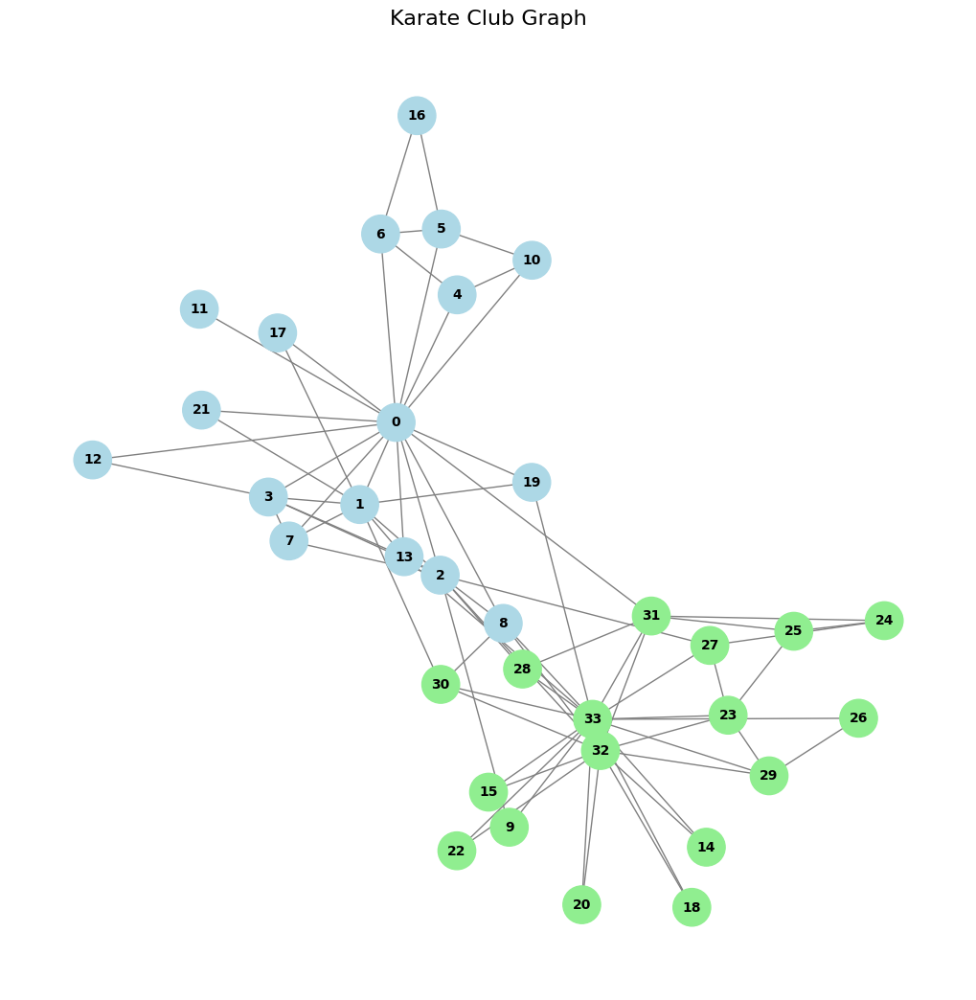

In [8]:
# Automatically determine node positions for a clean layout
pos = nx.spring_layout(G, seed=42)  # Using the "spring" layout algorithm

# Assign node colors based on the "club" attribute
node_colors = ['lightblue' if G.nodes[node]['club'] == 'Mr. Hi' else 'lightgreen' for node in G.nodes]

# Plot the graph
plt.figure(figsize=(10, 10))
nx.draw(
    G, 
    pos, 
    with_labels=True,             # Display node labels
    node_color=node_colors,       # Set node colors
    node_size=800,                # Set the size of the nodes
    edge_color="gray",            # Set the color of the edges
    font_size=10,                 # Set font size for labels
    font_color="black",           # Set font color for labels
    font_weight="bold"            # Set font weight for labels
)
plt.title("Karate Club Graph", fontsize=16)  # Add a title
plt.show()

# Prepare for node representation

In [9]:
num_nodes = G.number_of_nodes()  # Calculate the number of nodes dynamically
embed_size = 5  # Dimension of embeddings (can also be parameterized if needed)

# Create an embedding layer dynamically based on the number of nodes
embed = torch.nn.Embedding(num_nodes, embed_size)

# Extract the embedding weights and enable gradient computation
X = embed.weight
X = X.requires_grad_(True)

# Assign the graph data for further processing
data = G_data

In [10]:
all_edges=list(to_networkx(data).edges)

In [11]:
transform = RandomLinkSplit(is_undirected=True,num_val=0,num_test=.2)
train_data, val_data, test_data = transform(data)

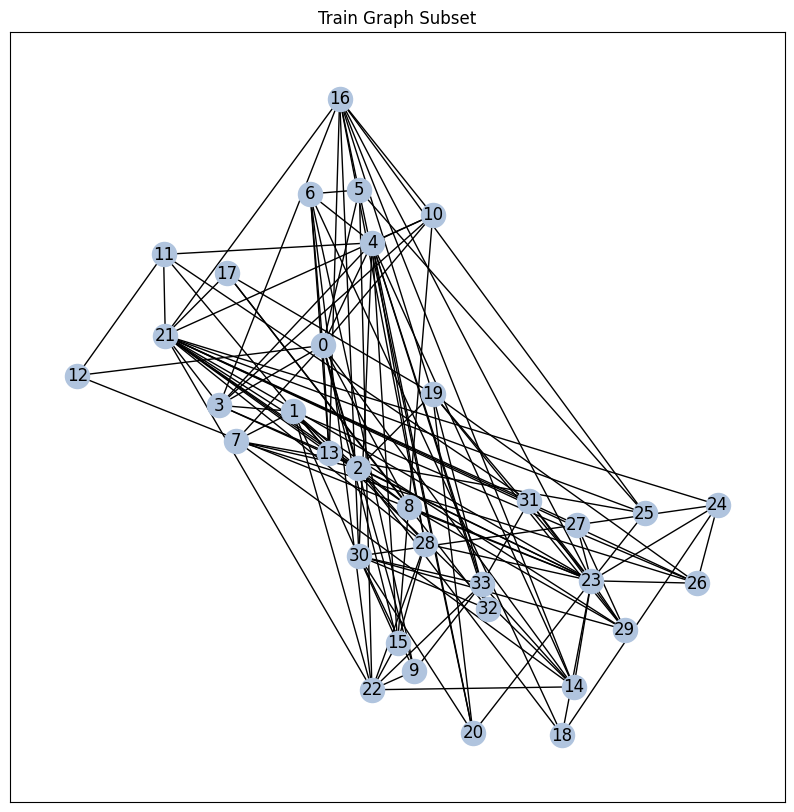

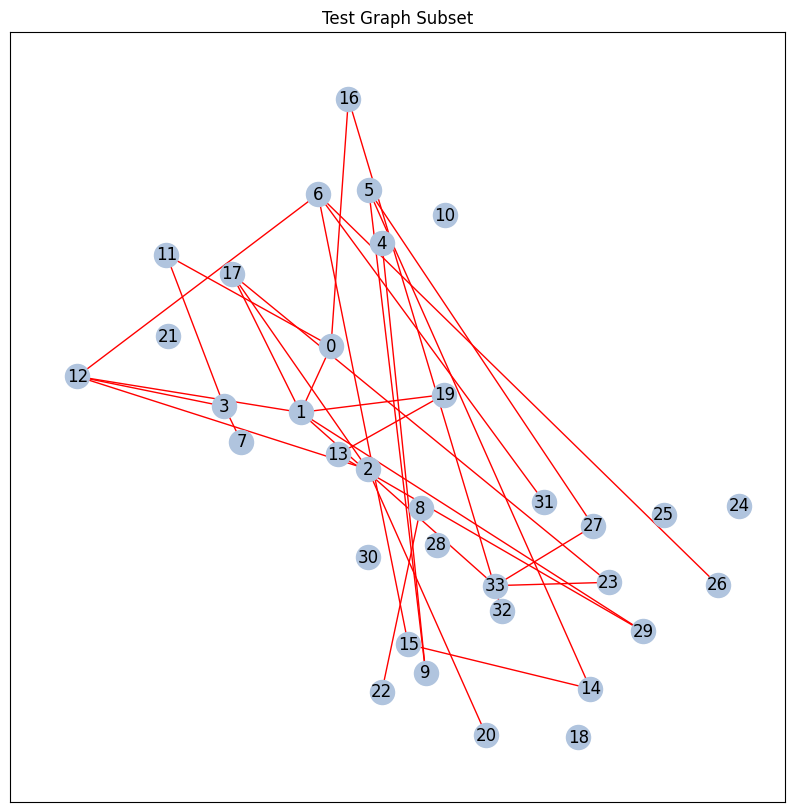

In [12]:
# Extracting train and test edges
train_edges = list(train_data.edge_label_index.t().numpy())
test_edges = list(test_data.edge_label_index.t().numpy())

# Creating graphs for train and test data
train_graph = nx.Graph()
test_graph = nx.Graph()

# Adding nodes
train_graph.add_nodes_from([i for i in range(34)])
test_graph.add_nodes_from([i for i in range(34)])

# Adding edges for train and test
train_graph.add_edges_from(train_edges)
test_graph.add_edges_from(test_edges)

# Plotting train graph
plt.figure(figsize=(10, 10))
plt.title('Train Graph Subset')
nx.draw_networkx(train_graph, pos=pos, node_color='lightsteelblue', edge_color='black')
plt.show()

# Plotting test graph
plt.figure(figsize=(10, 10))
plt.title('Test Graph Subset')
nx.draw_networkx(test_graph, pos=pos, node_color='lightsteelblue', edge_color='red')
plt.show()

In [13]:
# Create an empty list to store edges with their labels
edges_with_labels = []

# Iterate through all the edges in the train data
for i in range(train_data.edge_label_index.size()[1]):
    from_node = train_data['edge_label_index'][0][i].item()
    to_node = train_data['edge_label_index'][1][i].item() #dibentuk oleh randomlinksplit
    label = int(train_data['edge_label'][i].item())  # 1 for positive, 0 for negative
    edges_with_labels.append((from_node, to_node, label))

# Convert the list into a pandas DataFrame
edges_df = pd.DataFrame(edges_with_labels, columns=["from_node", "to_node", "edge_label"])

# Display the DataFrame
print(edges_df.head())  # Print the first few rows for inspection


   from_node  to_node  edge_label
0          0        6           1
1         18       23           1
2          6       22           1
3         16       30           1
4          1        2           1


In [14]:
edges_df.tail(4)

,from_node,to_node,edge_label
122,16,10,0
123,26,19,0
124,24,26,0
125,22,15,0


In [15]:
edges_df.sample(5)

,from_node,to_node,edge_label
73,13,11,0
19,2,21,1
116,24,18,0
67,13,23,0
94,22,21,0


# Prepare node position for training

In [16]:
# Function to generate node positions dynamically based on the number of nodes in the graph
def generate_node_positions(graph):
    num_nodes = graph.number_of_nodes()  # Get the number of nodes in the graph dynamically

    # Generate random positions for the nodes
    pos_list = [(0, 0.5)] + [(random.uniform(0.1, 1.9), random.uniform(0.0, 1)) for _ in range(num_nodes - 2)] + [(2, 0.5)]
    node_list = list(graph.nodes())  # List of nodes in the graph
    
    # Create a dictionary mapping node indices to positions
    pos = dict(zip(node_list, pos_list))
    return pos


pos = generate_node_positions(G)


# Prepare training part

labels=0---> 63  and labels=1---> 63


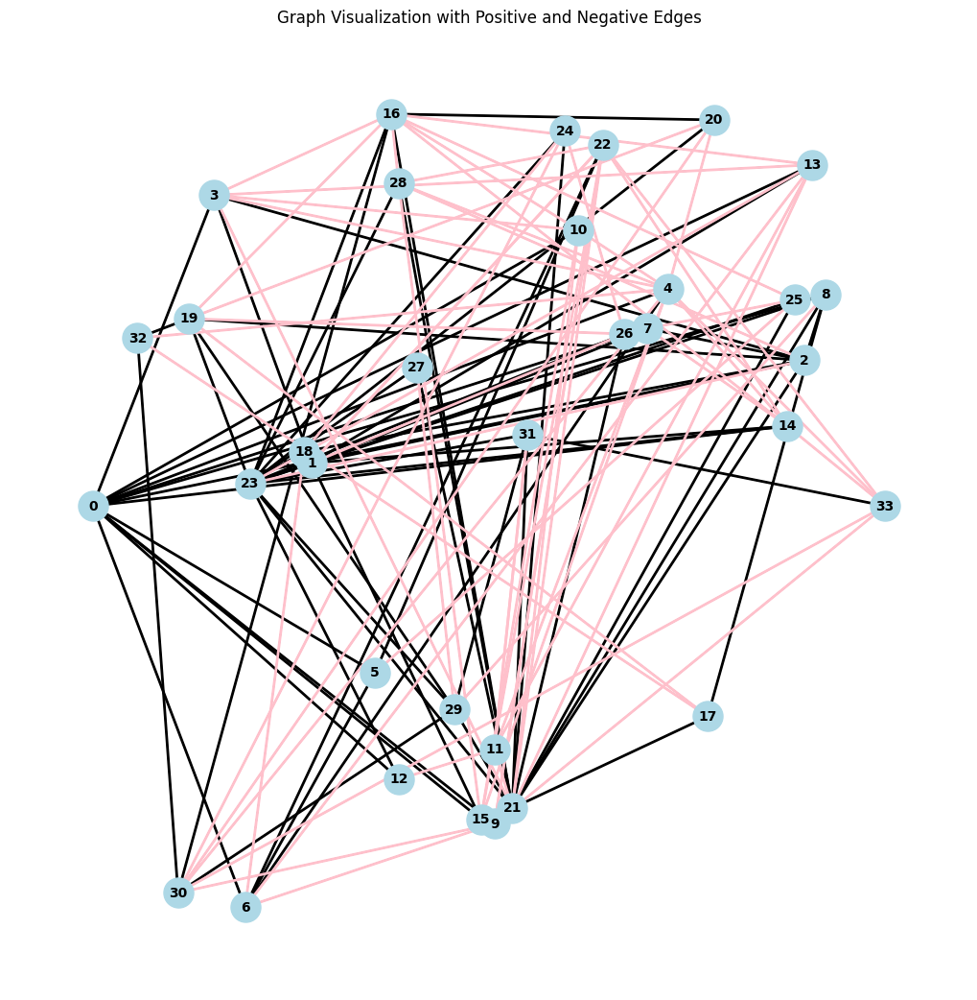

In [17]:

# Initialize an empty dictionary to store the edge labels
edge_labels = dict()

# Initialize an empty list to store the edge colors for visualization
edge_color = []

# Get the total number of edges in the training data
num_edges = train_data['edge_label_index'].size(1)

# Loop through all the edges in the training data
for i in range(num_edges):
    # Get the edge pair (from node, to node) and its label from train_data
    edge_labels[(train_data['edge_label_index'][0][i].item(), 
                 train_data['edge_label_index'][1][i].item())] = int(train_data['edge_label'][i].item())

# Create a list of edges that are labeled as positive (label=1)
train_edges_list = [i for i, j in edge_labels.items() if j == 1]

# Initialize counters for the number of positive and negative edges
n = 0
m = 0

# Re-initialize the edge_color list to store the specific colors for each edge
edge_color = []

# Loop through the edge labels to categorize edges as positive or negative and assign colors
for i, j in edge_labels.items():
    if j == 0:  # If edge label is 0 (negative edge)
        n += 1
        edge_color += ['pink']  # Assign 'pink' color for negative edges
    elif j == 1:  # If edge label is 1 (positive edge)
        m += 1
        edge_color += ['black']  # Assign 'black' color for positive edges

# Print the number of positive and negative edges
print(f'labels=0---> {n}  and labels=1---> {m}')

# Create a graph from the train data
G_train = nx.Graph()

# Add nodes and edges
G_train.add_edges_from(train_data['edge_label_index'].t().tolist())

# Visualize the graph with the edge colors based on edge labels
plt.figure(figsize=(10, 10))

# Draw the graph with node positions
nx.draw(G_train, pos=pos, with_labels=True, node_size=500, node_color='lightblue', font_size=10, font_weight='bold')

# Draw edges with the colors based on edge labels (black for positive, pink for negative)
nx.draw_networkx_edges(G_train, pos=pos, edgelist=train_edges_list, edge_color='black', width=2)  # positive edges
nx.draw_networkx_edges(G_train, pos=pos, edgelist=[e for e in edge_labels if edge_labels[e] == 0], edge_color='pink', width=2)  # negative edges

# Show the plot
plt.title('Graph Visualization with Positive and Negative Edges')
plt.axis('off')
plt.show()

# Prepare testing part

labels=0---> 15  and labels=1---> 15


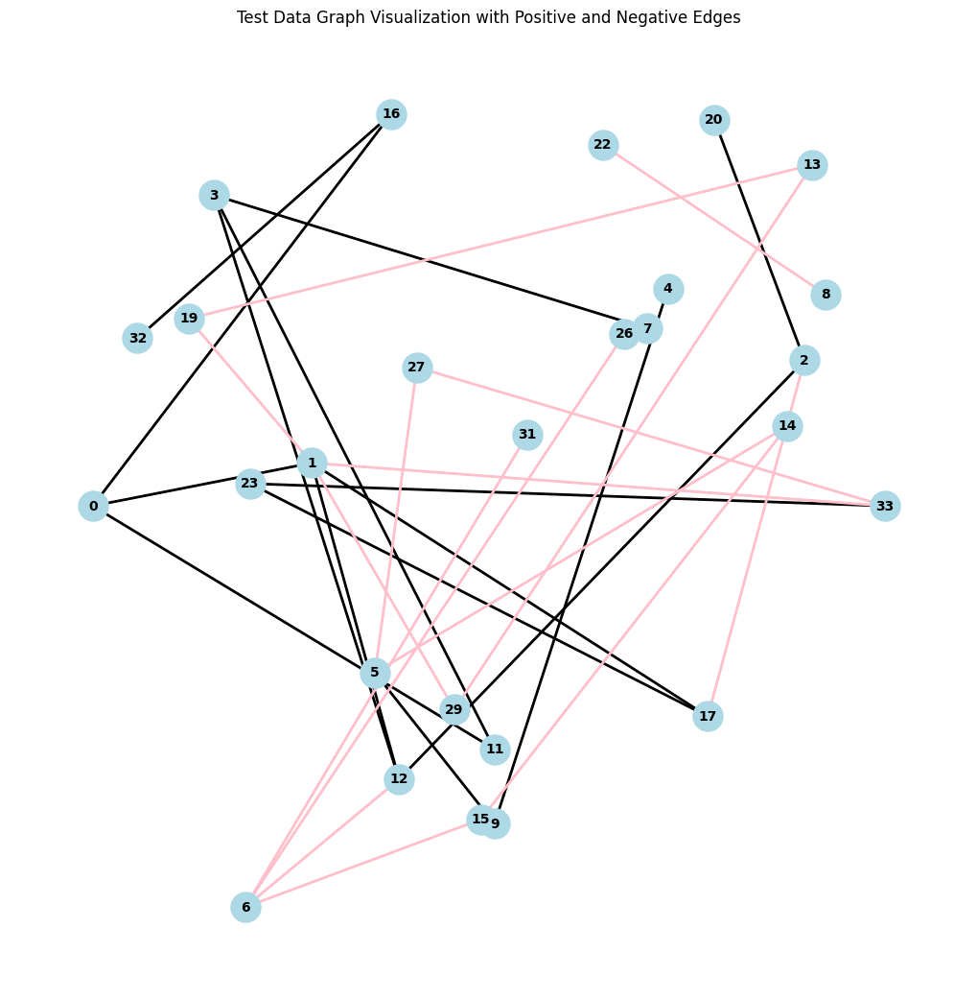

In [18]:
# Initialize an empty dictionary to store the edge labels
edge_labels = dict()

# Initialize an empty list to store the edge colors for visualization
edge_color = []

# Get the total number of edges in the test data (dynamically calculated)
num_edges = test_data['edge_label_index'].size(1)

# Loop through all the edges in the test data
for i in range(num_edges):
    # Get the edge pair (from node, to node) and its label from test_data
    edge_labels[(test_data['edge_label_index'][0][i].item(), 
                 test_data['edge_label_index'][1][i].item())] = int(test_data['edge_label'][i].item())

# Create a list of edges that are labeled as positive (label=1)
test_edges_list = [i for i, j in edge_labels.items() if j == 1]

# Initialize counters for the number of positive and negative edges
n = 0
m = 0

# Re-initialize the edge_color list to store the specific colors for each edge
edge_color = []

# Loop through the edge labels to categorize edges as positive or negative and assign colors
for i, j in edge_labels.items():
    if j == 0:  # If edge label is 0 (negative edge)
        n += 1
        edge_color += ['pink']  # Assign 'pink' color for negative edges
    elif j == 1:  # If edge label is 1 (positive edge)
        m += 1
        edge_color += ['black']  # Assign 'black' color for positive edges

# Print the number of positive and negative edges
print(f'labels=0---> {n}  and labels=1---> {m}')

# Create a graph from the test data
G_test = nx.Graph()

# Add nodes and edges
G_test.add_edges_from(test_data['edge_label_index'].t().tolist())

# Visualize the graph with the edge colors based on edge labels
plt.figure(figsize=(10, 10))

# Draw the graph with node positions
nx.draw(G_test, pos=pos, with_labels=True, node_size=500, node_color='lightblue', font_size=10, font_weight='bold')

# Draw edges with the colors based on edge labels (black for positive, pink for negative)
nx.draw_networkx_edges(G_test, pos=pos, edgelist=test_edges_list, edge_color='black', width=2)  # positive edges
nx.draw_networkx_edges(G_test, pos=pos, edgelist=[e for e in edge_labels if edge_labels[e] == 0], edge_color='pink', width=2)  # negative edges

# Show the plot
plt.title('Test Data Graph Visualization with Positive and Negative Edges')
plt.axis('off')
plt.show()


# Check availability edges

In [19]:
# Create a copy of all edges from the original edge list to preserve the original data
all = all_edges.copy()

# Print the total number of edges in the original list
print(len(all))

# Remove all edges that are part of the training set from the 'all' edge list
for i in train_edges_list:
    all.remove(i)

# Print the number of remaining edges after removing the training edges
# This shows the difference between the total edges and the training edges
print(f'all-train={len(all_edges)}-{len(train_edges_list)}={len(all)}')

# Remove all edges that are part of the test set from the 'all' edge list
for i in test_edges_list:
    all.remove(i)

# Print the number of remaining edges after removing both training and test edges
# This shows the difference between the total edges, training edges, and test edges
print(f'all-train-test={len(all_edges)}-{len(train_edges_list)}-{len(test_edges_list)}={len(all)}')

156
all-train=156-63=93
all-train-test=156-63-15=78


# Check training and testing edges

In [20]:
# Count the unique nodes in the training edges
train_nodes = set()
for edge in train_edges_list:
    train_nodes.update(edge)  # Add both nodes in the edge to the train_nodes set

# Count the unique nodes in the test edges
test_nodes = set()
for edge in test_edges_list:
    test_nodes.update(edge)  # Add both nodes in the edge to the test_nodes set

# Print the number of nodes for training and testing
print(f"Number of nodes used in training: {len(train_nodes)}")
print(f"Number of nodes used in testing: {len(test_nodes)}")

Number of nodes used in training: 33
Number of nodes used in testing: 16


# Prepare model nn

In [21]:
pos_edge_index=[]
for i in range(train_data.edge_label_index.size()[1]):
  if int(train_data['edge_label'][i].item())==1:
    pos_edge_index+=[(train_data['edge_label_index'][0][i].item(),train_data['edge_label_index'][1][i].item())]
pos_edge_index=torch.tensor( pos_edge_index, dtype=torch.long).t().contiguous()

epoch=0, train_acc=0.460317462682724, test_acc=0.5666666626930237
--------------------------------------------------
epoch=20, train_acc=0.4444444477558136, test_acc=0.6000000238418579
--------------------------------------------------
epoch=40, train_acc=0.460317462682724, test_acc=0.6000000238418579
--------------------------------------------------
epoch=60, train_acc=0.460317462682724, test_acc=0.5666666626930237
--------------------------------------------------
epoch=80, train_acc=0.4444444477558136, test_acc=0.5666666626930237
--------------------------------------------------
epoch=100, train_acc=0.4682539701461792, test_acc=0.5666666626930237
--------------------------------------------------
epoch=120, train_acc=0.4920634925365448, test_acc=0.5666666626930237
--------------------------------------------------
epoch=140, train_acc=0.4761904776096344, test_acc=0.5333333611488342
--------------------------------------------------
epoch=160, train_acc=0.4841269850730896, test_acc

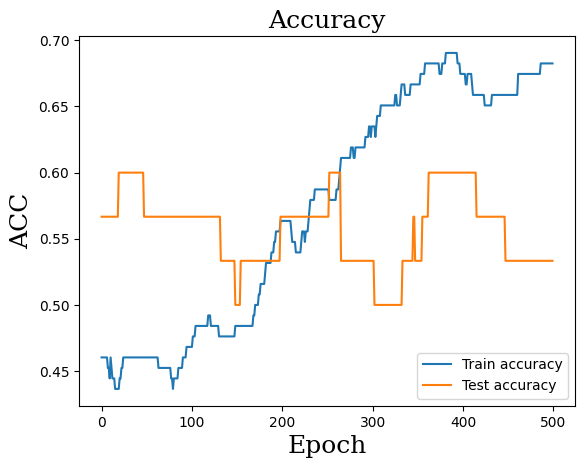

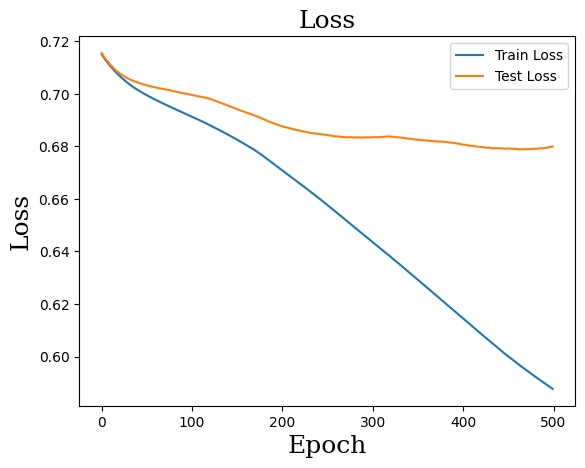

In [22]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv
import matplotlib.pyplot as plt
import pandas as pd

# Define your model
class Net2(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.GCN1 = GCNConv(in_channels, hidden_channels)
        self.GCN2 = GCNConv(hidden_channels, out_channels)
        self.lin = nn.Linear(out_channels*2, 1)

    def encode(self, x, edge_index):
        x = self.GCN1(x, edge_index)
        x = torch.relu(x)
        x = self.GCN2(x, edge_index)
        return x

    def decode(self, z, edge_label_index):
        return self.lin(torch.cat([z[edge_label_index[0]], z[edge_label_index[1]]], dim=-1))

# Initialize model, optimizer, and loss function
model = Net2(embed_size, 5, 2)  # Adjust embed_size accordingly
optimizer = torch.optim.Adam(model.parameters())
criterion = nn.BCEWithLogitsLoss()

# Training and testing lists
trainloss_list, trainacc_list, AllPredTrain = [], [], []
testloss_list, testacc_list, AllPredTest = [], [], []

T_epochs = 500  # Total number of epochs

# Training and testing loop
for epoch in range(T_epochs):
    edge_index = pos_edge_index
    
    z = model.encode(X, edge_index)  # Generate node embeddings

    # --------- TRAIN ---------
    pred_edge_label = model.decode(z, train_data.edge_label_index).view(-1)
    loss = criterion(pred_edge_label, train_data.edge_label)
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Track training loss and accuracy
    trainloss_list.append(loss.item())
    acc = ((pred_edge_label.sigmoid().round().int()) == train_data.edge_label.int()).float().mean().item()
    trainacc_list.append(acc)

    # Save predictions for each epoch
    trainlabels = list((pred_edge_label.sigmoid().round().int()))
    trainindex = [(train_data['edge_label_index'][0][i].item(), train_data['edge_label_index'][1][i].item()) for i in range(train_data.edge_label_index.size()[1])]
    AllPredTrain.append(dict(zip(trainindex, trainlabels)))

    # --------- TEST ---------
    pred_edge_label = model.decode(z, test_data.edge_label_index).view(-1)
    test_loss = criterion(pred_edge_label, test_data.edge_label)
    testloss_list.append(test_loss.item())
    
    test_acc = ((pred_edge_label.sigmoid().round().int()) == test_data.edge_label.int()).float().mean().item()
    testacc_list.append(test_acc)

    testlabels = list((pred_edge_label.sigmoid().round().int()))
    testindex = [(test_data['edge_label_index'][0][i].item(), test_data['edge_label_index'][1][i].item()) for i in range(test_data.edge_label_index.size()[1])]
    AllPredTest.append(dict(zip(testindex, testlabels)))

    if epoch % 20 == 0 or epoch == T_epochs - 1:
        print(f'epoch={epoch}, train_acc={acc}, test_acc={test_acc}')
        print('--------------------------------------------------')

# Plot training and testing accuracy over epochs
font_dict = {'family': 'serif', 'size': 18}
plt.figure()
plt.plot(trainacc_list, '-', label='Train accuracy')
plt.plot(testacc_list, '-', label='Test accuracy')
plt.xlabel('Epoch', fontdict=font_dict)
plt.ylabel('ACC', fontdict=font_dict)
plt.title('Accuracy', fontdict=font_dict)
plt.legend(loc='lower right')
plt.show()

# Plot training and testing loss over epochs
plt.figure()
plt.plot(trainloss_list, '-', label='Train Loss')
plt.plot(testloss_list, '-', label='Test Loss')
plt.xlabel('Epoch', fontdict=font_dict)
plt.ylabel('Loss', fontdict=font_dict)
plt.title('Loss', fontdict=font_dict)
plt.legend(loc='upper right')
plt.show()


# Create animation

In [23]:
# Set up the animation settings for inline display in Jupyter
rc('animation', html='jshtml')

# Define the update function for the animation
def update(i):
    i = int(i)  # Convert i to integer
    edge_labels = AllPredTest[i]  # Get the edge labels at epoch i

    # Create a graph and add nodes and edges
    G = nx.Graph()
    G.add_nodes_from([i for i in range(len(pos))])  # Use the correct number of nodes from pos
    G.add_edges_from(dict(edge_labels))

    plt.cla()  # Clear the axis
    ax.set_aspect('equal')  # Maintain aspect ratio
    ax.axis('off')  # Hide the axis
    ax.set_title(f'Epoch: {i}, acc={testacc_list[i]}')  # Set the title with accuracy

    # Prepare edge colors based on predictions
    edge_color = []
    P_label = list(edge_labels.values())
    T_label = list(test_data.edge_label.detach().numpy().astype(int))
    
    # Determine edge colors based on prediction correctness
    for jj in range(len(P_label)):
        if P_label[jj] == T_label[jj] and P_label[jj] == 0:
            edge_color += ['paleturquoise']  # True negative
        elif P_label[jj] == T_label[jj] and P_label[jj] == 1:
            edge_color += ['black']  # True positive
        elif P_label[jj] != T_label[jj]:
            edge_color += ['red']  # Wrong prediction

    # Draw the graph with the specified edge colors
    nx.draw_networkx(G, pos=pos, edge_color=edge_color, width=1.5, node_color='silver')

    # Add custom legend for the edge colors
    ax.add_patch(plt.Circle((0, .5), 0.06, color='crimson', alpha=0.7))
    ax.add_patch(plt.Circle((2, .5), 0.06, color='darkgreen', alpha=.7))
    ax.text(-.29, .5, 'Instructor', fontdict={'color': 'crimson'})
    ax.text(2.085, .5, 'Administrator', fontdict={'color': 'darkgreen'})

    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='black', lw=4),
                    Line2D([0], [0], color='paleturquoise', lw=4),
                    Line2D([0], [0], color='red', lw=4)]
    ax.legend(custom_lines, ['True positive sample', 'True negative sample', 'Wrong prediction'], loc='upper left')

# Set the number of frames based on the length of AllPredTest
num_frames = min(T_epochs + 9, len(AllPredTest))  # Ensure frames do not exceed AllPredTest length

# Create the figure for the animation
fig, ax = plt.subplots(figsize=(10, 6))

# Create the animation
ani = FuncAnimation(fig, func=update, frames=np.arange(0, num_frames, 10), interval=700, repeat=False)

# Display the animation in Jupyter
display(ani)

# Save the animation to a video file
writervideo = animation.FFMpegWriter(fps=1)
ani.save('karate.mp4', writer=writervideo)

# Close the plot after saving the animation
plt.close()

# Save and model test

C:\Users\User\AppData\Local\Temp\ipykernel_15244\1545128080.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_n = torch.load(PATH)
C:\Users\User\AppData\Local\Temp\i

test accuracy=0.5


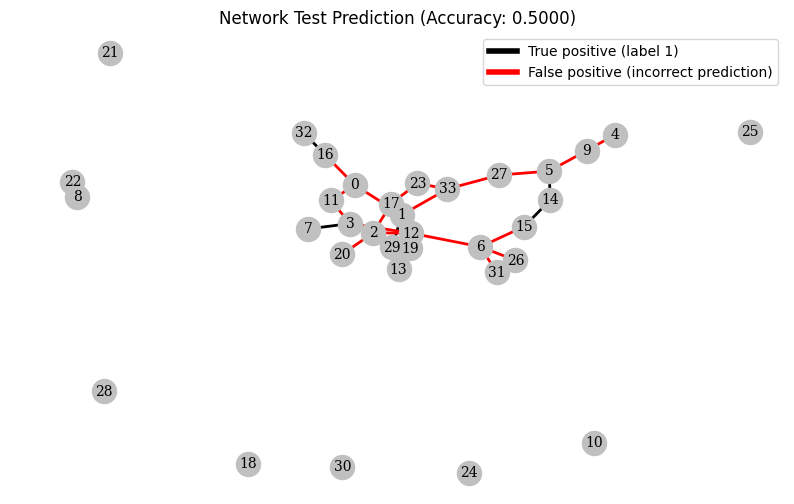

In [24]:
# Load the saved model
PATH = 'c:/Users/User/Documents/GNN/model_scripted_updated.pt'
model_n = torch.load(PATH)
model_n.eval()

# Encode and decode to get predicted edge labels
edge_index = pos_edge_index
z = model_n.encode(X, edge_index)
pred_edge_label = model_n.decode(z, test_data.edge_label_index).view(-1)

# Convert predictions to binary labels (0 or 1)
testlabels = list((pred_edge_label.sigmoid().round().int()))
test_acc = ((pred_edge_label.sigmoid().round().int()) == test_data.edge_label.int()).float().mean().item()
print(f'test accuracy={test_acc}')

# Create a graph based on the predicted edge labels
# Fix the unhashable error by converting the list of edge indices into tuples
edge_labels = dict(zip([tuple(edge) for edge in test_data.edge_label_index.T.tolist()], testlabels))

G = nx.Graph()
G.add_nodes_from([i for i in range(len(pos))])  # Add nodes based on number of nodes in data

# Add edges based on predicted labels (1 for positive, 0 for negative)
G.add_edges_from([(i, j) for (i, j), label in edge_labels.items() if label == 1])  # Positive edges (True)
G.add_edges_from([(i, j) for (i, j), label in edge_labels.items() if label == 0])  # Negative edges (False)

# Set edge colors based on the label
# 'black' for true positive edges, 'red' for false positive (incorrect predictions)
edge_color = ['black' if label == 1 else 'red' for label in testlabels]

# Set the positions of the nodes for the plot (using spring layout for aesthetics)
pos = nx.spring_layout(G, seed=42)

# Plot the graph
plt.figure(figsize=(10, 6))

# Draw nodes (silver color)
nx.draw_networkx_nodes(G, pos, node_color='silver', node_size=300)

# Draw edges (color based on prediction accuracy)
nx.draw_networkx_edges(G, pos, edge_color=edge_color, width=2)

# Draw labels for nodes
nx.draw_networkx_labels(G, pos, font_size=10, font_family='serif')

# Add a legend to explain the colors
legend_elements = [
    Line2D([0], [0], color='black', lw=4, label='True positive (label 1)'),
    Line2D([0], [0], color='red', lw=4, label='False positive (incorrect prediction)')
]

plt.legend(handles=legend_elements, loc='upper right')

# Add title and hide axes
plt.title(f"Network Test Prediction (Accuracy: {test_acc:.4f})")
plt.axis('off')  # Hide axis

# Show the graph
plt.show()

In [25]:
# Convert predictions to binary labels (0 or 1)
testlabels = list((pred_edge_label.sigmoid().round().int()))

# Calculate accuracy
test_acc = ((pred_edge_label.sigmoid().round().int()) == test_data.edge_label.int()).float().mean().item()

# Calculate Precision, Recall, F1 Score, and AUC
precision = precision_score(test_data.edge_label.int().cpu(), testlabels, zero_division=0)
recall = recall_score(test_data.edge_label.int().cpu(), testlabels, zero_division=0)
f1 = f1_score(test_data.edge_label.int().cpu(), testlabels, zero_division=0)

# Detach the tensor and convert it to NumPy for roc_auc_score
roc_auc = roc_auc_score(test_data.edge_label.int().cpu(), pred_edge_label.sigmoid().detach().cpu())

# Print the results
print(f'Test Accuracy: {test_acc}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

Test Accuracy: 0.5
Precision: 0.5
Recall: 0.2
F1 Score: 0.2857142857142857
ROC AUC: 0.5777777777777777


In [29]:
# Apply threshold and convert to 0 or 1
predicted_labels = [1 if pred.item() >= 0.5 else 0 for pred in pred_edge_label.sigmoid()]

# Construct the edge data dictionary with predicted labels
edge_data = {
    'Source Node': test_data.edge_label_index[0].tolist(),
    'Target Node': test_data.edge_label_index[1].tolist(),
    'Predicted Label': predicted_labels,  # Use 0 or 1 labels
    'True Label': test_data.edge_label.int().cpu().numpy().tolist()
}

# Convert to DataFrame
df = pd.DataFrame(edge_data)
df

,Source Node,Target Node,Predicted Label,True Label
0,3,7,0,1
1,17,23,0,1
2,3,11,0,1
3,16,32,1,1
4,0,1,0,1
5,23,33,0,1
6,3,12,0,1
7,1,17,1,1
8,0,16,0,1
9,0,11,0,1
